### Introduction: Taxi Fare Prediction###


Welcome to the Taxi Fare Kaggle challenge. In this contest, the aim is to predict the fare of a taxi ride given the starting time, the starting and ending latitude / longitude, and the number of passengers. 

In this kernel I am going to demonstrate the basic steps to tackle with a real life machine learning challenge. 

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/new-york-city-taxi-fare-prediction/GCP-Coupons-Instructions.rtf
/kaggle/input/new-york-city-taxi-fare-prediction/train.csv
/kaggle/input/new-york-city-taxi-fare-prediction/test.csv
/kaggle/input/new-york-city-taxi-fare-prediction/sample_submission.csv


We would keep the first 2m records for faster processing

In [2]:
train_data = pd.read_csv("/kaggle/input/new-york-city-taxi-fare-prediction/train.csv", nrows = 2000000)
test_data = pd.read_csv("/kaggle/input/new-york-city-taxi-fare-prediction/test.csv", nrows = 20000)

In [3]:
print(train_data.shape)
print(test_data.shape)

train_data["dataset"] = "train"
test_data["dataset"] = "test"

(2000000, 8)
(9914, 7)


In [4]:
X = pd.concat((train_data, test_data))
X.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
count,2.000000e+06,2.009914e+06,2.009914e+06,2.009900e+06,2.009900e+06,2.009914e+06
mean,1.134779e+01,-7.253037e+01,3.993368e+01,-7.253110e+01,3.993214e+01,1.684050e+00
std,9.852883e+00,1.283667e+01,7.963847e+00,1.274383e+01,1.029848e+01,1.314806e+00
min,-6.200000e+01,-3.377681e+03,-3.458665e+03,-3.383297e+03,-3.461541e+03,0.000000e+00
25%,6.000000e+00,-7.399208e+01,4.073492e+01,-7.399141e+01,4.073400e+01,1.000000e+00
50%,8.500000e+00,-7.398182e+01,4.075263e+01,-7.398016e+01,4.075313e+01,1.000000e+00
75%,1.250000e+01,-7.396713e+01,4.076710e+01,-7.396369e+01,4.076810e+01,2.000000e+00
max,1.273310e+03,2.856442e+03,2.621628e+03,3.414307e+03,3.345917e+03,2.080000e+02


In [5]:
# X = train_data.drop(("fare_amount"), axis = 1)
# y = train_data[["fare_amount"]]
# X = train_data

In [6]:
print('Train columns with null values:\n', X.isnull().sum())
print("-"*10)

Train columns with null values:
 key                     0
fare_amount          9914
pickup_datetime         0
pickup_longitude        0
pickup_latitude         0
dropoff_longitude      14
dropoff_latitude       14
passenger_count         0
dataset                 0
dtype: int64
----------


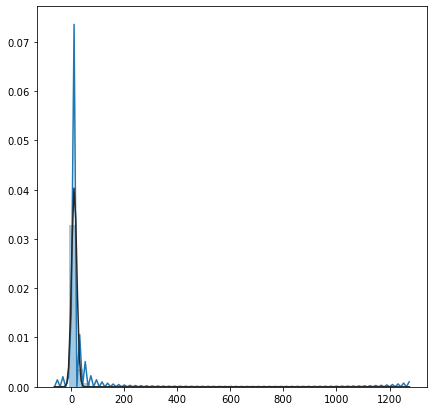

In [7]:
f, ax = plt.subplots(figsize=(7, 7))
_ = sns.distplot(X[["fare_amount"]], fit=norm)

## Exclude Outlier

The starting fare is $2.5. So we exclude fares with extreme values. 

source : https://www1.nyc.gov/site/tlc/passengers/taxi-fare.page#:~:text=%242.50%20initial%20charge.,Dutchess%2C%20Orange%20or%20Putnam%20Counties.

In [8]:
X = X[X['fare_amount'].between(left = 2.5, right = 100)& (X["dataset"]== "train") | (X["dataset"]=="test")]

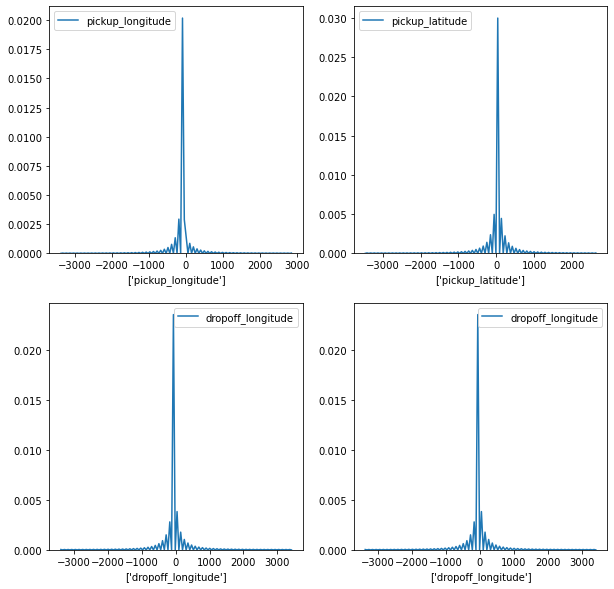

In [9]:
f, ax = plt.subplots(figsize=(10, 10))
k = ["pickup_longitude", "pickup_latitude","dropoff_longitude","dropoff_longitude"]
for i, field in enumerate(k, 1):
    plt.subplot(2,2,i)
    _ = sns.kdeplot(X[field])
    plt.xlabel([field])


In [10]:
for col in ['pickup_latitude', 'pickup_longitude', 'dropoff_latitude', 'dropoff_longitude']:
    print(f'{col.capitalize():20}: 2.5% = {round(np.percentile(X[col], 2.5), 2):5} \t 97.5% = {round(np.percentile(X[col], 97.5), 2)}')

Pickup_latitude     : 2.5% = 40.64 	 97.5% = 40.8
Pickup_longitude    : 2.5% = -74.01 	 97.5% = -73.78
Dropoff_latitude    : 2.5% =   nan 	 97.5% = nan
Dropoff_longitude   : 2.5% =   nan 	 97.5% = nan


Exclude the outlier

In [11]:
# valid location of New York Manhattan -73.844311	40.721319
# X = X[(X["pickup_longitude"] != 0) & (X["dropoff_latitude"] != 0)& (X["pickup_latitude"] != 0)& (X["dropoff_longitude"] != 0)]
X = X[(X["pickup_longitude"] < -70) & (X["pickup_longitude"] > -76) & (X["pickup_latitude"] < 43) & (X["pickup_latitude"] > 37) &
     (X["dropoff_longitude"] < -70) & (X["dropoff_longitude"] > -76) & (X["dropoff_latitude"] < 43) & (X["dropoff_latitude"] > 37)]

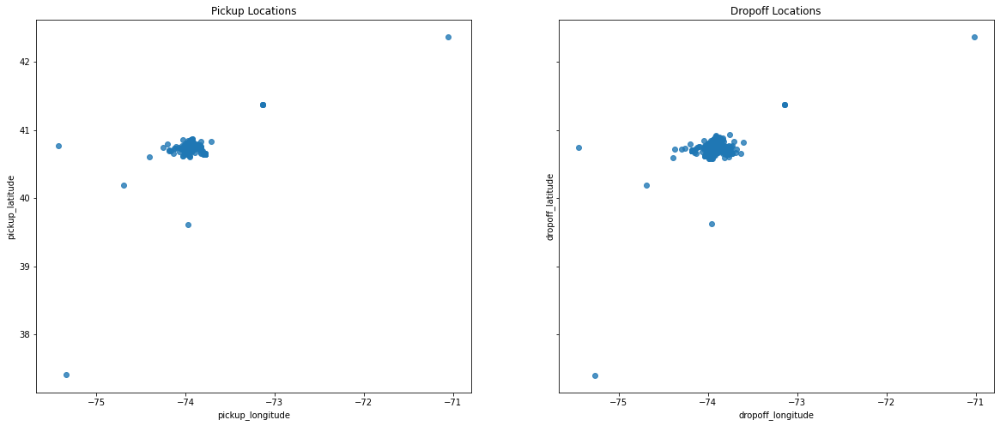

In [12]:
fig, axes = plt.subplots(1, 2, figsize = (20, 8), sharex=True, sharey=True)
axes = axes.flatten()

# Plot Longitude (x) and Latitude (y)
sns.regplot('pickup_longitude', 'pickup_latitude', fit_reg = False, 
            data  = X.sample(10000, random_state = 100), ax = axes[0]);
sns.regplot('dropoff_longitude', 'dropoff_latitude', fit_reg = False, 
            data  = X.sample(10000, random_state = 100), ax = axes[1]);
axes[0].set_title('Pickup Locations')
axes[1].set_title('Dropoff Locations');

Plot the folium map and we can see some coordinates falling in the sea. They should be wrong inputs but let's disregard them at this moment.

In [13]:
# sas install folium
import folium
from folium.plugins import MarkerCluster
from folium import plugins
from folium.plugins import HeatMap

df_txn_display_pickup = X[:50000]

m=folium.Map([ 40.72,-74.00],zoom_start=10)
HeatMap(df_txn_display_pickup[['dropoff_latitude','dropoff_longitude']].dropna(),radius=8,gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(m)
m


In [14]:
n=folium.Map([ 40.72,-74.00],zoom_start=10)
HeatMap(df_txn_display_pickup[['pickup_latitude','pickup_longitude']].dropna(),radius=8,gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(n)
n

Binning the fare 


In [15]:
X

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,dataset
0,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21 UTC,-73.844311,40.721319,-73.841610,40.712278,1,train
1,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16 UTC,-74.016048,40.711303,-73.979268,40.782004,1,train
2,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00 UTC,-73.982738,40.761270,-73.991242,40.750562,2,train
3,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42 UTC,-73.987130,40.733143,-73.991567,40.758092,1,train
4,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00 UTC,-73.968095,40.768008,-73.956655,40.783762,1,train
...,...,...,...,...,...,...,...,...,...
9909,2015-05-10 12:37:51.0000002,NaN,2015-05-10 12:37:51 UTC,-73.968124,40.796997,-73.955643,40.780388,6,test
9910,2015-01-12 17:05:51.0000001,NaN,2015-01-12 17:05:51 UTC,-73.945511,40.803600,-73.960213,40.776371,6,test
9911,2015-04-19 20:44:15.0000001,NaN,2015-04-19 20:44:15 UTC,-73.991600,40.726608,-73.789742,40.647011,6,test
9912,2015-01-31 01:05:19.0000005,NaN,2015-01-31 01:05:19 UTC,-73.985573,40.735432,-73.939178,40.801731,6,test


In [16]:
X.groupby("dataset")["dataset"].agg("count")

dataset
test        9914
train    1958015
Name: dataset, dtype: int64

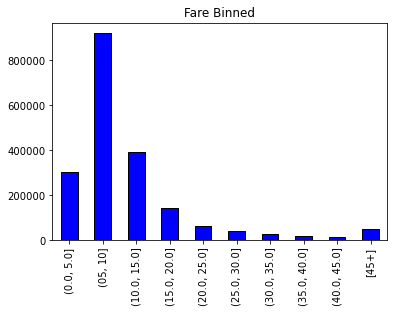

In [17]:
# Bin the fare and convert to string
X['fare-bin'] = pd.cut(X['fare_amount'], bins = list(range(0, 50, 5))).astype(str)

# Uppermost bin
X.loc[X['fare-bin'] == 'nan', 'fare-bin'] = '[45+]'

# Adjust bin so the sorting is correct
X.loc[X['fare-bin'] == '(5.0, 10.0]', 'fare-bin'] = '(05, 10]'

# Bar plot of value counts
X['fare-bin'].value_counts().sort_index().plot.bar(color = 'b', edgecolor = 'k');
plt.title('Fare Binned');

In [18]:
def ecdf(x):
    """Empirical cumulative distribution function of a variable"""
    # Sort in ascending order
    x = np.sort(x)
    n = len(x)
    
    # Go from 1/n to 1
    y = np.arange(1, n + 1, 1) / n
    
    return x, y

Text(0.5, 0, 'Fare Amount ($)')

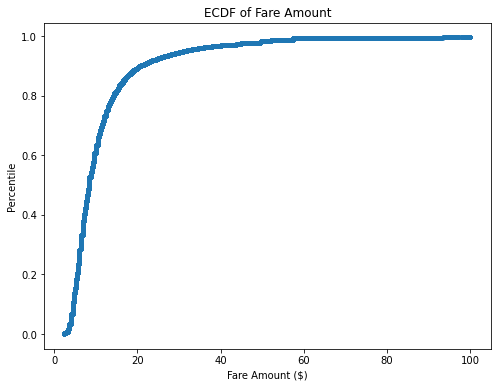

In [19]:
xs, ys = ecdf(X['fare_amount'])
plt.figure(figsize = (8, 6))
plt.plot(xs, ys, '.')
plt.ylabel('Percentile')
plt.title('ECDF of Fare Amount')
plt.xlabel('Fare Amount ($)')

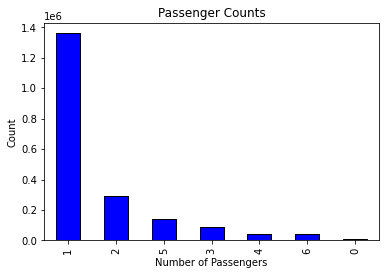

In [20]:
X['passenger_count'].value_counts().plot.bar(color = 'b', edgecolor = 'k');
plt.title('Passenger Counts'); plt.xlabel('Number of Passengers'); plt.ylabel('Count');



In [21]:
X = X[X['passenger_count'].between(left = 1, right = 6)]

In [22]:
# Create a color mapping based on fare bins
palette = sns.color_palette('Paired', 10)
color_mapping = {fare_bin: palette[i] for i, fare_bin in enumerate(X['fare-bin'].unique())}
color_mapping

X['color'] = X['fare-bin'].map(color_mapping)
plot_data = X.sample(1_000_000, random_state = 100)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [23]:
X

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,dataset,fare-bin,color
0,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21 UTC,-73.844311,40.721319,-73.841610,40.712278,1,train,"(0.0, 5.0]","(0.6509803921568628, 0.807843137254902, 0.8901..."
1,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16 UTC,-74.016048,40.711303,-73.979268,40.782004,1,train,"(15.0, 20.0]","(0.12156862745098039, 0.47058823529411764, 0.7..."
2,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00 UTC,-73.982738,40.761270,-73.991242,40.750562,2,train,"(05, 10]","(0.6980392156862745, 0.8745098039215686, 0.541..."
3,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42 UTC,-73.987130,40.733143,-73.991567,40.758092,1,train,"(05, 10]","(0.6980392156862745, 0.8745098039215686, 0.541..."
4,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00 UTC,-73.968095,40.768008,-73.956655,40.783762,1,train,"(05, 10]","(0.6980392156862745, 0.8745098039215686, 0.541..."
...,...,...,...,...,...,...,...,...,...,...,...
9909,2015-05-10 12:37:51.0000002,NaN,2015-05-10 12:37:51 UTC,-73.968124,40.796997,-73.955643,40.780388,6,test,[45+],"(0.9921568627450981, 0.7490196078431373, 0.435..."
9910,2015-01-12 17:05:51.0000001,NaN,2015-01-12 17:05:51 UTC,-73.945511,40.803600,-73.960213,40.776371,6,test,[45+],"(0.9921568627450981, 0.7490196078431373, 0.435..."
9911,2015-04-19 20:44:15.0000001,NaN,2015-04-19 20:44:15 UTC,-73.991600,40.726608,-73.789742,40.647011,6,test,[45+],"(0.9921568627450981, 0.7490196078431373, 0.435..."
9912,2015-01-31 01:05:19.0000005,NaN,2015-01-31 01:05:19 UTC,-73.985573,40.735432,-73.939178,40.801731,6,test,[45+],"(0.9921568627450981, 0.7490196078431373, 0.435..."


In [24]:
BB_zoom = (-74.1, -73.7, 40.6, 40.85)
nyc_map_zoom = plt.imread('https://github.com/WillKoehrsen/Machine-Learning-Projects/blob/master/images/nyc_-74.1_-73.7_40.6_40.85.PNG?raw=true')

/opt/conda/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


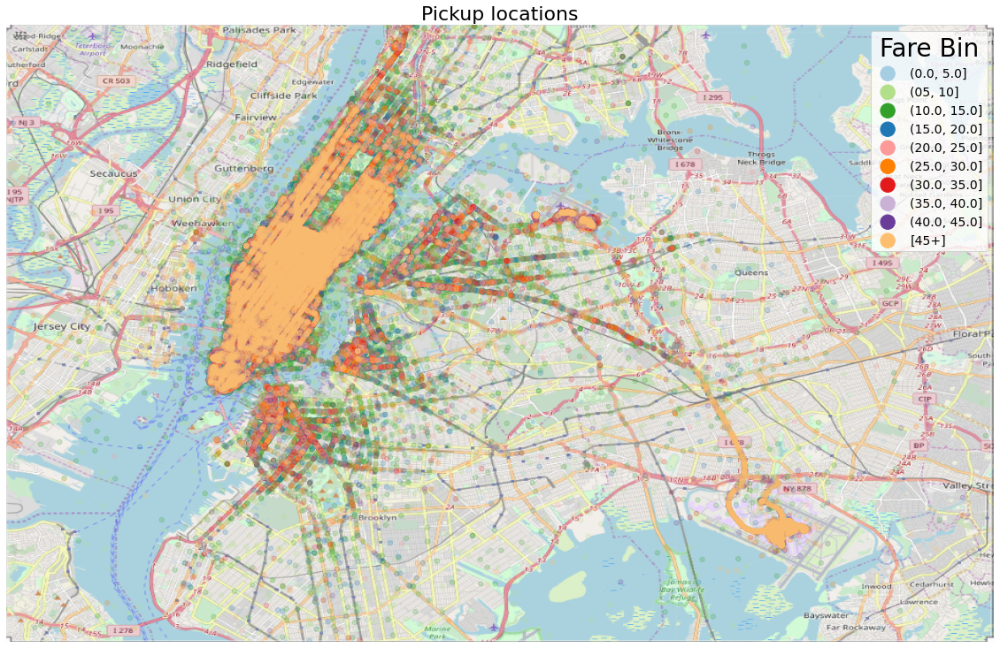

In [25]:

fig, axs = plt.subplots(1, 1, figsize=(20, 18))

# Plot the pickups
for b, df in plot_data.groupby('fare-bin'):
    # Set the zorder to 1 to plot on top of map
    axs.scatter(df.pickup_longitude, df.pickup_latitude, zorder=1, alpha=0.2, c=df.color, s=30, label = f'{b}')
    axs.set_title('Pickup locations', size = 22)
    axs.axis('off')

# Legend
leg = axs.legend(fontsize = 14, markerscale = 3)

# Adjust alpha of legend markers
for lh in leg.legendHandles: 
    lh.set_alpha(1)

leg.set_title('Fare Bin', prop = {'size': 28})

# Show map in background (zorder = 0)
axs.imshow(nyc_map_zoom, zorder=0, extent=BB_zoom);

In [26]:
# Absolute difference in latitude and longitude
X['abs_lat_diff'] = (X['dropoff_latitude'] - X['pickup_latitude']).abs()
X['abs_lon_diff'] = (X['dropoff_longitude'] - X['pickup_longitude']).abs()

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


/opt/conda/lib/python3.7/site-packages/seaborn/regression.py:574: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


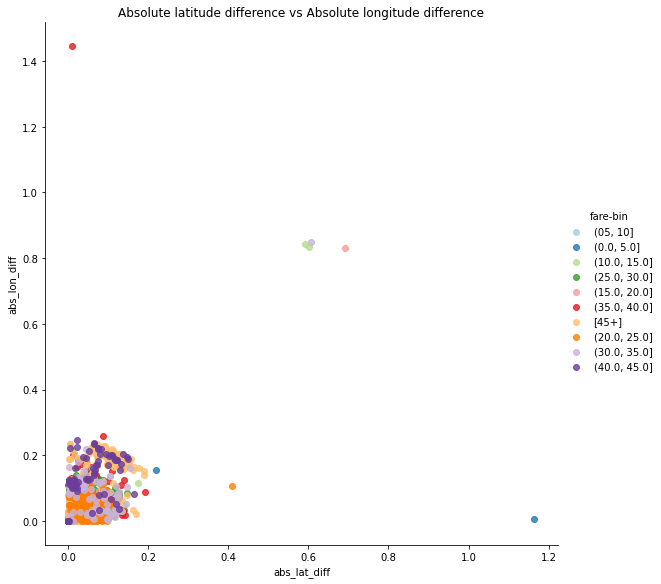

In [27]:
sns.lmplot('abs_lat_diff', 'abs_lon_diff', hue = 'fare-bin', size = 8, palette=palette,
           fit_reg = False, data = X.sample(10000, random_state=100));
plt.title('Absolute latitude difference vs Absolute longitude difference');

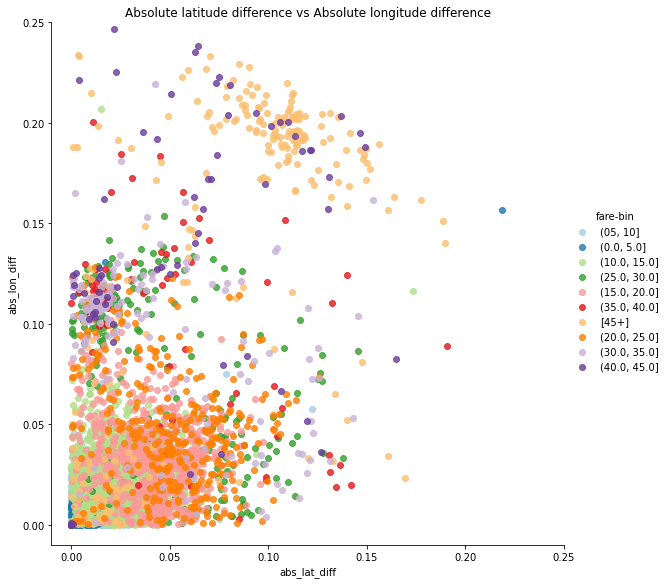

In [28]:
sns.lmplot('abs_lat_diff', 'abs_lon_diff', hue = 'fare-bin', size = 8, palette=palette,
           fit_reg = False, data = X.sample(10000, random_state=100));
plt.title('Absolute latitude difference vs Absolute longitude difference');

plt.xlim((-0.01, .25)); plt.ylim((-0.01, .25))
plt.title('Absolute latitude difference vs Absolute longitude difference');

In [29]:
no_diff = X[(X['abs_lat_diff'] == 0) & (X['abs_lon_diff'] == 0)]
no_diff.shape

(20873, 13)

There is 20788 records with no change in distance

In [30]:
X

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,dataset,fare-bin,color,abs_lat_diff,abs_lon_diff
0,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21 UTC,-73.844311,40.721319,-73.841610,40.712278,1,train,"(0.0, 5.0]","(0.6509803921568628, 0.807843137254902, 0.8901...",0.009041,0.002701
1,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16 UTC,-74.016048,40.711303,-73.979268,40.782004,1,train,"(15.0, 20.0]","(0.12156862745098039, 0.47058823529411764, 0.7...",0.070701,0.036780
2,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00 UTC,-73.982738,40.761270,-73.991242,40.750562,2,train,"(05, 10]","(0.6980392156862745, 0.8745098039215686, 0.541...",0.010708,0.008504
3,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42 UTC,-73.987130,40.733143,-73.991567,40.758092,1,train,"(05, 10]","(0.6980392156862745, 0.8745098039215686, 0.541...",0.024949,0.004437
4,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00 UTC,-73.968095,40.768008,-73.956655,40.783762,1,train,"(05, 10]","(0.6980392156862745, 0.8745098039215686, 0.541...",0.015754,0.011440
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9909,2015-05-10 12:37:51.0000002,NaN,2015-05-10 12:37:51 UTC,-73.968124,40.796997,-73.955643,40.780388,6,test,[45+],"(0.9921568627450981, 0.7490196078431373, 0.435...",0.016609,0.012482
9910,2015-01-12 17:05:51.0000001,NaN,2015-01-12 17:05:51 UTC,-73.945511,40.803600,-73.960213,40.776371,6,test,[45+],"(0.9921568627450981, 0.7490196078431373, 0.435...",0.027229,0.014702
9911,2015-04-19 20:44:15.0000001,NaN,2015-04-19 20:44:15 UTC,-73.991600,40.726608,-73.789742,40.647011,6,test,[45+],"(0.9921568627450981, 0.7490196078431373, 0.435...",0.079597,0.201859
9912,2015-01-31 01:05:19.0000005,NaN,2015-01-31 01:05:19 UTC,-73.985573,40.735432,-73.939178,40.801731,6,test,[45+],"(0.9921568627450981, 0.7490196078431373, 0.435...",0.066299,0.046394


In [31]:
import datetime as dt
import time

# X["fulldatetime"] = X["pickup_datetime"]
# X["fulldatetime"] = [a.strip(" UTC") for a in X["fulldatetime"]]
# X["date"] = [dt.dt.strptime(b, '%Y-%m-%d %H:%M:%S').date() for b in X["fulldatetime"]]
# X["time"] = [datetime.datetime.strptime(b, '%Y-%m-%d %H:%M:%S').time() for b in X["fulldatetime"]]

def add_datetime_info(dataset):
    #Convert to datetime format
    dataset['pickup_datetime'] = pd.to_datetime(dataset['pickup_datetime'],format="%Y-%m-%d %H:%M:%S UTC")
    
    dataset['hour'] = dataset.pickup_datetime.dt.hour
    dataset['day'] = dataset.pickup_datetime.dt.day
    dataset['month'] = dataset.pickup_datetime.dt.month
    dataset['weekday'] = dataset.pickup_datetime.dt.weekday
    dataset['year'] = dataset.pickup_datetime.dt.year
    
    return dataset

add_datetime_info(X)

# Convert date to ordinal date 
# example :
# >>> date2
# datetime.datetime(2012, 2, 2, 0, 0)
# >>> tstamp = time.mktime(date2.timetuple())
# >>> tstamp
# 1328121000.0

X["fulldatetimetuple"] = [time.mktime(a.timetuple()) for a in X["pickup_datetime"]]


# Euclidean Distance 
X["straightdist"] = ((X["pickup_longitude"] - X["dropoff_longitude"])**2 + (X["pickup_latitude"] - X["dropoff_latitude"])**2)**0.5

# Manhattan Distance
X["manhattan"] = X['abs_lat_diff'] + X['abs_lon_diff'] 


# Haversine Distance 
from haversine import haversine, Unit

X['pickup'] = list(zip(X.pickup_latitude, X.pickup_longitude))
X['dropoff'] = list(zip(X.dropoff_latitude, X.dropoff_longitude))

def calculate_haversine(row):
    dis = haversine(row['pickup'], row['dropoff'])
    return dis

X["haverdist"] = X.apply(calculate_haversine, axis=1)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See 

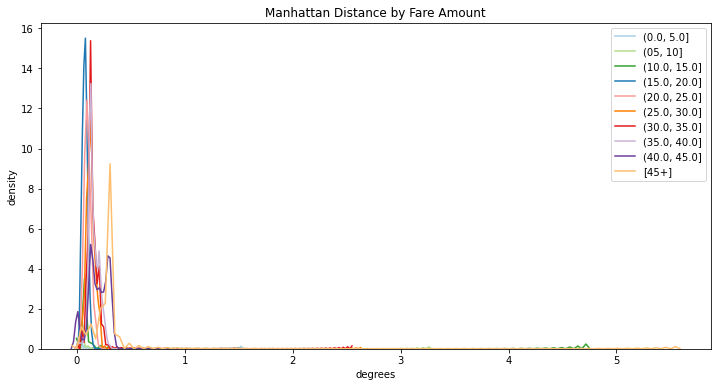

In [32]:
  
 # Calculate distribution by each fare bin
plt.figure(figsize = (12, 6))
for f, grouped in X.groupby('fare-bin'):
    sns.kdeplot(grouped['manhattan'], label = f'{f}', color = list(grouped['color'])[0]);

plt.xlabel('degrees'); plt.ylabel('density')
plt.title('Manhattan Distance by Fare Amount');

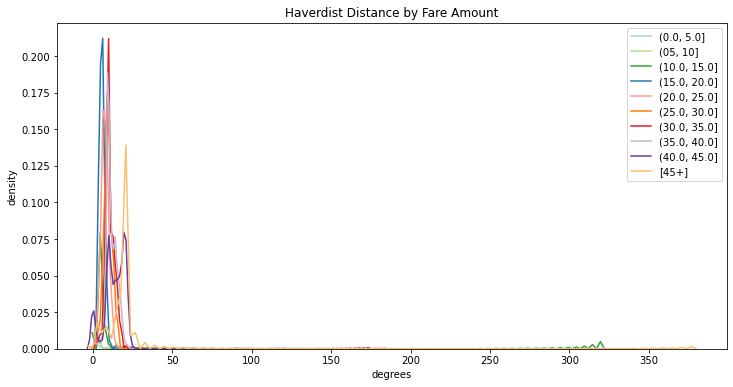

In [33]:
  
 # Calculate distribution by each fare bin
plt.figure(figsize = (12, 6))
for f, grouped in X.groupby('fare-bin'):
    sns.kdeplot(grouped['haverdist'], label = f'{f}', color = list(grouped['color'])[0]);

plt.xlabel('degrees'); plt.ylabel('density')
plt.title('Haverdist Distance by Fare Amount');

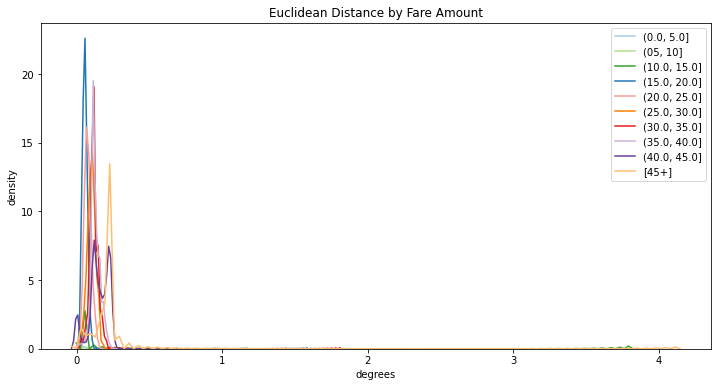

In [34]:
# Calculate distribution by each fare bin
plt.figure(figsize = (12, 6))
for f, grouped in X.groupby('fare-bin'):
    sns.kdeplot(grouped['straightdist'], label = f'{f}', color = list(grouped['color'])[0]);

plt.xlabel('degrees'); plt.ylabel('density')
plt.title('Euclidean Distance by Fare Amount');

In [35]:
X.groupby('fare-bin')['straightdist'].agg(['mean', 'count'])

,mean,count
fare-bin,,
"(0.0, 5.0]",0.009340,302149
"(05, 10]",0.019617,916522
"(10.0, 15.0]",0.036914,389278
"(15.0, 20.0]",0.055251,143748
"(20.0, 25.0]",0.075711,62170
"(25.0, 30.0]",0.101323,38740
"(30.0, 35.0]",0.117680,28596
"(35.0, 40.0]",0.127950,16721
"(40.0, 45.0]",0.154820,13534


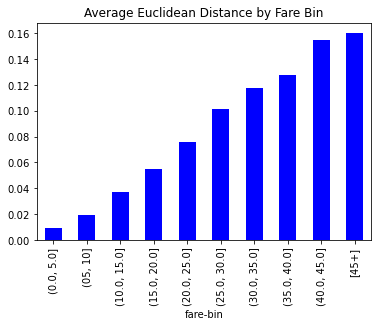

In [36]:
X.groupby('fare-bin')['straightdist'].mean().plot.bar(color = 'b');
plt.title('Average Euclidean Distance by Fare Bin');

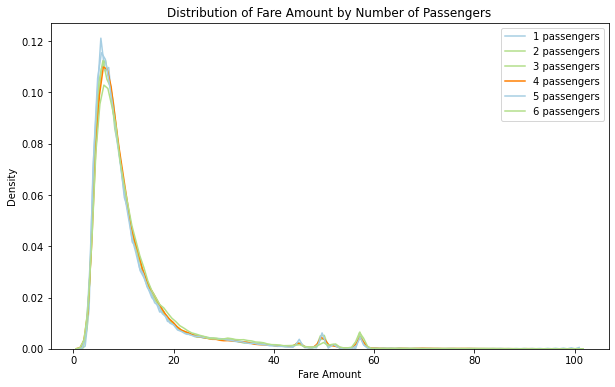

In [37]:
plt.figure(figsize = (10, 6))

for p, grouped in X.groupby('passenger_count'):
    sns.kdeplot(grouped['fare_amount'], label = f'{p} passengers', color = list(grouped['color'])[0]);
    
plt.xlabel('Fare Amount'); plt.ylabel('Density')
plt.title('Distribution of Fare Amount by Number of Passengers');


In [38]:
X.groupby('passenger_count')['fare_amount'].agg(['mean', 'count'])

,mean,count
passenger_count,,
1,11.153271,1353611
2,11.764442,290140
3,11.487981,85907
4,11.685109,41825
5,11.207859,138470
6,12.158704,41109


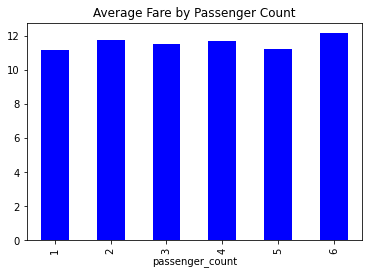

In [39]:
X.groupby('passenger_count')['fare_amount'].mean().plot.bar(color = 'b');
plt.title('Average Fare by Passenger Count');

In [40]:
# f, ax = plt.subplots(figsize=(7, 7))
# _ = sns.pairplot(X.sample(1000, random_state = 100))

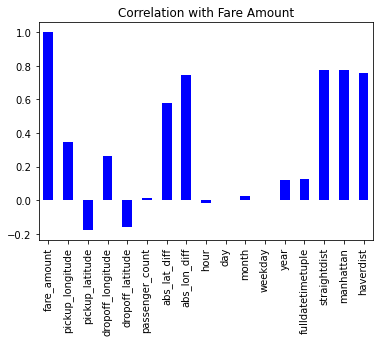

In [41]:
corrs = X.corr()
corrs['fare_amount'].plot.bar(color = 'b');
plt.title('Correlation with Fare Amount');


In [42]:
X.sample(5)

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,dataset,fare-bin,...,day,month,weekday,year,fulldatetimetuple,straightdist,manhattan,pickup,dropoff,haverdist
1303739,2009-12-06 19:58:32.0000002,6.1,2009-12-06 19:58:32,-73.987204,40.736253,-73.973206,40.755650,1,train,"(05, 10]",...,6,12,6,2009,1.260130e+09,0.023920,0.033395,"(40.736253000000005, -73.987204)","(40.75565, -73.973206)",2.458167
654501,2013-08-15 21:21:00.000000150,12.0,2013-08-15 21:21:00,-73.983800,40.768057,-73.995882,40.732917,1,train,"(10.0, 15.0]",...,15,8,3,2013,1.376602e+09,0.037159,0.047222,"(40.768057, -73.9838)","(40.732917, -73.995882)",4.037766
1180949,2012-04-20 16:16:00.000000109,19.3,2012-04-20 16:16:00,-74.010247,40.719922,-73.973252,40.756677,1,train,"(15.0, 20.0]",...,20,4,4,2012,1.334939e+09,0.052149,0.073750,"(40.719922, -74.01024699999999)","(40.756677, -73.973252)",5.139895
833835,2012-09-15 15:55:17.0000004,19.5,2012-09-15 15:55:17,-73.947167,40.771840,-73.999174,40.725218,1,train,"(15.0, 20.0]",...,15,9,5,2012,1.347725e+09,0.069845,0.098629,"(40.771840000000005, -73.94716700000001)","(40.725218, -73.999174)",6.787397
1607126,2011-04-10 12:32:00.00000094,7.3,2011-04-10 12:32:00,-73.997582,40.746502,-73.977855,40.764767,1,train,"(05, 10]",...,10,4,6,2011,1.302439e+09,0.026884,0.037992,"(40.746502, -73.997582)","(40.764767, -73.977855)",2.624086


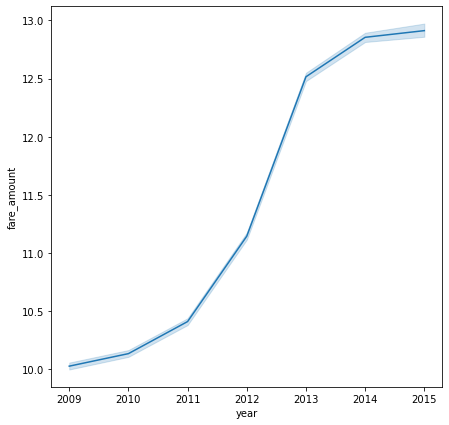

In [43]:
f, ax = plt.subplots(figsize=(7, 7))
sns.lineplot(x="year", y="fare_amount",data=X)

#### Year : fare amount is higher generally in post 2013 compared to pre 2013 


#### Weekday / day / month : no trend observed

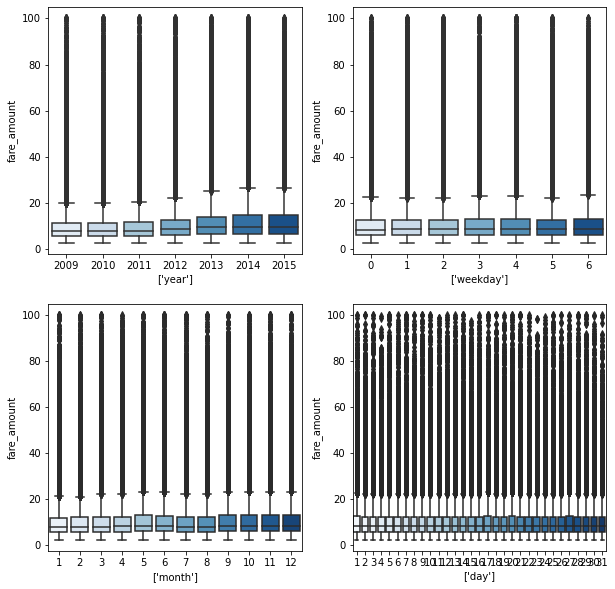

In [44]:
f, ax = plt.subplots(figsize=(10, 10))
k = ["year", "weekday","month","day"]
for i, field in enumerate(k, 1):
    plt.subplot(2,2,i)
    _ = sns.boxplot(y = X["fare_amount"], x = X[field], palette="Blues")
    plt.xlabel([field])


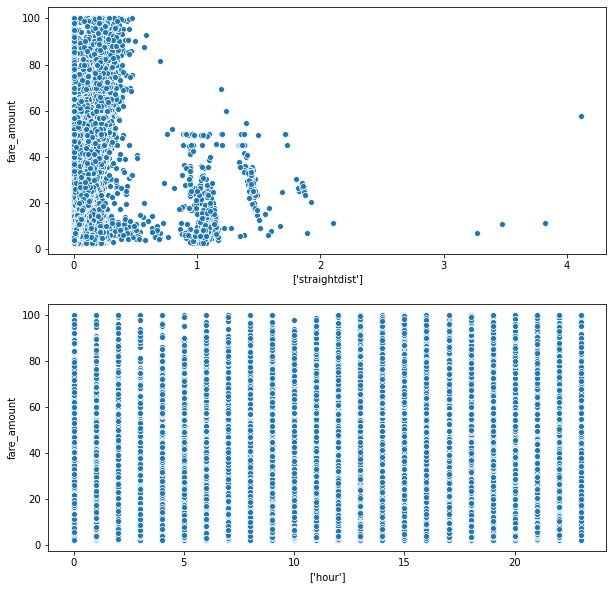

In [45]:
f, ax = plt.subplots(figsize=(10, 10))
k = ["straightdist", "hour"]
for i, field in enumerate(k, 1):
    plt.subplot(2,1,i)
    _ = sns.scatterplot(y = X["fare_amount"], x = X[field], palette="Blues")
    plt.xlabel([field])
    
# sns.scatterplot(x="straightdist", y="fare_amount",data=X)

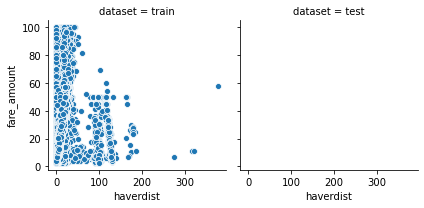

In [46]:
# f, ax = plt.subplots(figsize=(10, 10))
e = sns.FacetGrid(X, col =  "dataset")
e.map(sns.scatterplot, "haverdist", "fare_amount") 

#no fare amount in test dataset

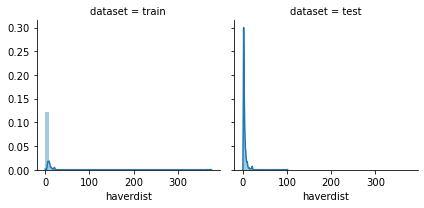

In [47]:
f = sns.FacetGrid(X, col =  "dataset")
f.map(sns.distplot, "haverdist")

In [48]:
# Only 412 records with haverdist > 30km out of 2m records
X[X["haverdist"]>100]

X = X[X["haverdist"]<100]

# delete negative fare for training data
X = X[ ((X["fare_amount"]>0) & (X["dataset"]== "train")) | (X["dataset"]=="test")]

In [49]:
# X[(X["haverdist"]<0.2) & (X["fare_amount"]>10)] 

# X = X.drop(X[(X["haverdist"]<0.2) & (X["fare_amount"]>10)].index)

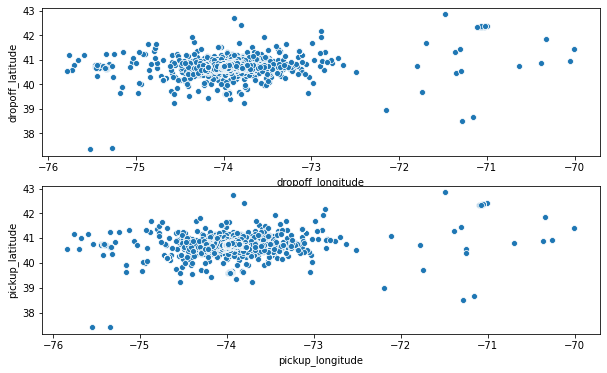

In [50]:
plt.figure(figsize=(10,6))

k = {"dropoff" : ["dropoff_longitude",  "dropoff_latitude"],
     "pickup" : ["pickup_longitude",  "pickup_latitude"]}
for i, field in enumerate(k, 1):
    plt.subplot(2,1,i)
    _ = sns.scatterplot(y = X[k[field][1]], x = X[k[field][0]], palette="Blues")
    plt.xlabel(k[field][0])
    plt.ylabel(k[field][1])

In [51]:
# sas install folium
import folium
from folium.plugins import MarkerCluster
from folium import plugins
from folium.plugins import HeatMap

df_txn_display_pickup = X[:50000]

m=folium.Map([ 40.72,-74.00],zoom_start=10)
HeatMap(df_txn_display_pickup[['dropoff_latitude','dropoff_longitude']].dropna(),radius=8,gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(m)
m


In [52]:
n=folium.Map([ 40.72,-74.00],zoom_start=10)
HeatMap(df_txn_display_pickup[['pickup_latitude','pickup_longitude']].dropna(),radius=8,gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(n)
n

In [53]:
X.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,abs_lat_diff,abs_lon_diff,hour,day,month,weekday,year,fulldatetimetuple,straightdist,manhattan,haverdist
count,1.950652e+06,1.960566e+06,1.960566e+06,1.960566e+06,1.960566e+06,1.960566e+06,1.960566e+06,1.960566e+06,1.960566e+06,1.960566e+06,1.960566e+06,1.960566e+06,1.960566e+06,1.960566e+06,1.960566e+06,1.960566e+06,1.960566e+06
mean,1.129398e+01,-7.397522e+01,4.075095e+01,-7.397430e+01,4.075129e+01,1.690296e+00,2.129845e-02,2.275008e-02,1.350779e+01,1.570760e+01,6.273839e+00,3.040469e+00,2.011738e+03,1.332278e+09,3.405241e-02,4.404853e-02,3.323846e+00
std,9.381239e+00,4.096342e-02,3.164753e-02,4.017755e-02,3.465735e-02,1.305150e+00,2.388660e-02,3.477402e-02,6.516559e+00,8.682622e+00,3.437534e+00,1.950225e+00,1.865743e+00,5.849285e+07,3.989268e-02,5.220508e-02,3.724501e+00
min,2.500000e+00,-7.583662e+01,3.741688e+01,-7.578276e+01,3.734653e+01,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,2.009000e+03,1.230768e+09,0.000000e+00,0.000000e+00,0.000000e+00
25%,6.000000e+00,-7.399229e+01,4.073653e+01,-7.399159e+01,4.073551e+01,1.000000e+00,6.935000e-03,6.130000e-03,9.000000e+00,8.000000e+00,3.000000e+00,1.000000e+00,2.010000e+03,1.281865e+09,1.280861e-02,1.636887e-02,1.253874e+00
50%,8.500000e+00,-7.398210e+01,4.075333e+01,-7.398062e+01,4.075383e+01,1.000000e+00,1.416200e-02,1.270000e-02,1.400000e+01,1.600000e+01,6.000000e+00,3.000000e+00,2.012000e+03,1.332368e+09,2.179934e-02,2.811200e-02,2.152700e+00
75%,1.250000e+01,-7.396835e+01,4.076751e+01,-7.396536e+01,4.076839e+01,2.000000e+00,2.720100e-02,2.392578e-02,1.900000e+01,2.300000e+01,9.000000e+00,5.000000e+00,2.013000e+03,1.382279e+09,3.872323e-02,5.082100e-02,3.915119e+00
max,1.000000e+02,-7.000039e+01,4.284427e+01,-7.000227e+01,4.285413e+01,6.000000e+00,8.735150e-01,1.082670e+00,2.300000e+01,3.100000e+01,1.200000e+01,6.000000e+00,2.015000e+03,1.435708e+09,1.089126e+00,1.483612e+00,9.999618e+01


In [54]:
X[X["straightdist"]==None]

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,dataset,fare-bin,...,day,month,weekday,year,fulldatetimetuple,straightdist,manhattan,pickup,dropoff,haverdist


In [55]:
X = X.drop(X[X["straightdist"].isna()].index)  #drop straightdist = NA
X

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,dataset,fare-bin,...,day,month,weekday,year,fulldatetimetuple,straightdist,manhattan,pickup,dropoff,haverdist
0,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21,-73.844311,40.721319,-73.841610,40.712278,1,train,"(0.0, 5.0]",...,15,6,0,2009,1.245087e+09,0.009436,0.011742,"(40.721319, -73.844311)","(40.712278000000005, -73.84161)",1.030765
1,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16,-74.016048,40.711303,-73.979268,40.782004,1,train,"(15.0, 20.0]",...,5,1,1,2010,1.262710e+09,0.079696,0.107481,"(40.711303, -74.016048)","(40.782004, -73.979268)",8.450145
2,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00,-73.982738,40.761270,-73.991242,40.750562,2,train,"(05, 10]",...,18,8,3,2011,1.313628e+09,0.013674,0.019212,"(40.76127, -73.982738)","(40.750562, -73.991242)",1.389527
3,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42,-73.987130,40.733143,-73.991567,40.758092,1,train,"(05, 10]",...,21,4,5,2012,1.334983e+09,0.025340,0.029386,"(40.733143, -73.98713000000001)","(40.758092, -73.991567)",2.799274
4,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00,-73.968095,40.768008,-73.956655,40.783762,1,train,"(05, 10]",...,9,3,1,2010,1.268121e+09,0.019470,0.027194,"(40.768008, -73.96809499999999)","(40.783762, -73.956655)",1.999160
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9909,2015-05-10 12:37:51.0000002,NaN,2015-05-10 12:37:51,-73.968124,40.796997,-73.955643,40.780388,6,test,[45+],...,10,5,6,2015,1.431261e+09,0.020776,0.029091,"(40.7969970703125, -73.96812438964845)","(40.78038787841797, -73.95564270019531)",2.124877
9910,2015-01-12 17:05:51.0000001,NaN,2015-01-12 17:05:51,-73.945511,40.803600,-73.960213,40.776371,6,test,[45+],...,12,1,0,2015,1.421082e+09,0.030945,0.041931,"(40.8036003112793, -73.94551086425781)","(40.77637100219727, -73.96021270751955)",3.270973
9911,2015-04-19 20:44:15.0000001,NaN,2015-04-19 20:44:15,-73.991600,40.726608,-73.789742,40.647011,6,test,[45+],...,19,4,6,2015,1.429476e+09,0.216985,0.281456,"(40.72660827636719, -73.9916000366211)","(40.647010803222656, -73.78974151611328)",19.183968
9912,2015-01-31 01:05:19.0000005,NaN,2015-01-31 01:05:19,-73.985573,40.735432,-73.939178,40.801731,6,test,[45+],...,31,1,5,2015,1.422666e+09,0.080920,0.112694,"(40.73543167114258, -73.9855728149414)","(40.80173110961913, -73.93917846679686)",8.343498


In [56]:
X[X.isna().any(axis=1)]  #display all NA 

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,dataset,fare-bin,...,day,month,weekday,year,fulldatetimetuple,straightdist,manhattan,pickup,dropoff,haverdist
0,2015-01-27 13:08:24.0000002,NaN,2015-01-27 13:08:24,-73.973320,40.763805,-73.981430,40.743835,1,test,[45+],...,27,1,1,2015,1.422364e+09,0.021554,0.028080,"(40.7638053894043, -73.97332000732422)","(40.74383544921875, -73.98143005371094)",2.323263
1,2015-01-27 13:08:24.0000003,NaN,2015-01-27 13:08:24,-73.986862,40.719383,-73.998886,40.739201,1,test,[45+],...,27,1,1,2015,1.422364e+09,0.023180,0.031841,"(40.719383239746094, -73.98686218261719)","(40.739200592041016, -73.99888610839844)",2.425356
2,2011-10-08 11:53:44.0000002,NaN,2011-10-08 11:53:44,-73.982524,40.751260,-73.979654,40.746139,1,test,[45+],...,8,10,5,2011,1.318075e+09,0.005870,0.007991,"(40.751259999999995, -73.982524)","(40.746139, -73.97965400000001)",0.618629
3,2012-12-01 21:12:12.0000002,NaN,2012-12-01 21:12:12,-73.981160,40.767807,-73.990448,40.751635,1,test,[45+],...,1,12,5,2012,1.354396e+09,0.018649,0.025460,"(40.767807, -73.98116)","(40.751635, -73.990448)",1.961035
4,2012-12-01 21:12:12.0000003,NaN,2012-12-01 21:12:12,-73.966046,40.789775,-73.988565,40.744427,1,test,[45+],...,1,12,5,2012,1.354396e+09,0.050631,0.067867,"(40.789775, -73.96604599999999)","(40.744427, -73.98856500000001)",5.387309
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9909,2015-05-10 12:37:51.0000002,NaN,2015-05-10 12:37:51,-73.968124,40.796997,-73.955643,40.780388,6,test,[45+],...,10,5,6,2015,1.431261e+09,0.020776,0.029091,"(40.7969970703125, -73.96812438964845)","(40.78038787841797, -73.95564270019531)",2.124877
9910,2015-01-12 17:05:51.0000001,NaN,2015-01-12 17:05:51,-73.945511,40.803600,-73.960213,40.776371,6,test,[45+],...,12,1,0,2015,1.421082e+09,0.030945,0.041931,"(40.8036003112793, -73.94551086425781)","(40.77637100219727, -73.96021270751955)",3.270973
9911,2015-04-19 20:44:15.0000001,NaN,2015-04-19 20:44:15,-73.991600,40.726608,-73.789742,40.647011,6,test,[45+],...,19,4,6,2015,1.429476e+09,0.216985,0.281456,"(40.72660827636719, -73.9916000366211)","(40.647010803222656, -73.78974151611328)",19.183968
9912,2015-01-31 01:05:19.0000005,NaN,2015-01-31 01:05:19,-73.985573,40.735432,-73.939178,40.801731,6,test,[45+],...,31,1,5,2015,1.422666e+09,0.080920,0.112694,"(40.73543167114258, -73.9855728149414)","(40.80173110961913, -73.93917846679686)",8.343498


In [57]:
X.isna().sum()

key                     0
fare_amount          9914
pickup_datetime         0
pickup_longitude        0
pickup_latitude         0
dropoff_longitude       0
dropoff_latitude        0
passenger_count         0
dataset                 0
fare-bin                0
color                   0
abs_lat_diff            0
abs_lon_diff            0
hour                    0
day                     0
month                   0
weekday                 0
year                    0
fulldatetimetuple       0
straightdist            0
manhattan               0
pickup                  0
dropoff                 0
haverdist               0
dtype: int64

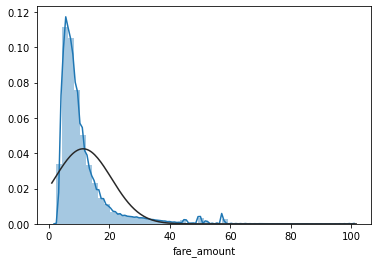

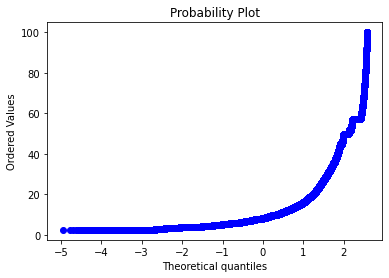

In [58]:
#histogram and normal probability plot\
from scipy.stats import norm
import scipy.stats as stats

sns.distplot(X['fare_amount'], fit=norm);
fig = plt.figure()
res = stats.probplot(X['fare_amount'],  plot=plt)


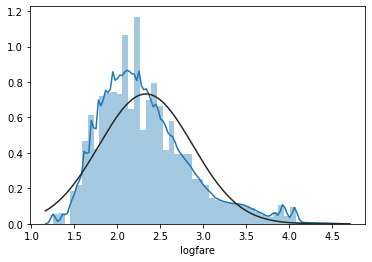

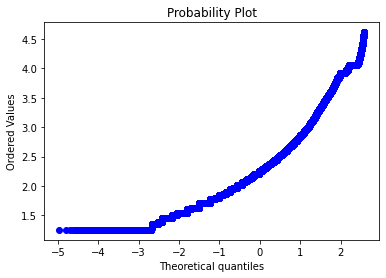

In [59]:
X["logfare"] = np.log1p(X['fare_amount'])

sns.distplot(X["logfare"] , fit=norm);
fig = plt.figure()
res = stats.probplot(X['logfare'],  plot=plt)



In [60]:
from scipy.special import boxcox1p
X.skew(axis = 0, skipna = True) 
lam = 0.15

X["skewhaverdist"] = boxcox1p(X["haverdist"], lam)


In [61]:
import re

def extract_dateinfo(df, date_col, drop=True, time=False, 
                     start_ref = pd.datetime(1900, 1, 1),
                     extra_attr = False):
    """
    Extract Date (and time) Information from a DataFrame
    Adapted from: https://github.com/fastai/fastai/blob/master/fastai/structured.py
    """
    df = df.copy()
    
    # Extract the field
    fld = df[date_col]
    
    # Check the time
    fld_dtype = fld.dtype
    if isinstance(fld_dtype, pd.core.dtypes.dtypes.DatetimeTZDtype):
        fld_dtype = np.datetime64

    # Convert to datetime if not already
    if not np.issubdtype(fld_dtype, np.datetime64):
        df[date_col] = fld = pd.to_datetime(fld, infer_datetime_format=True)
    

    # Prefix for new columns
    pre = re.sub('[Dd]ate', '', date_col)
    pre = re.sub('[Tt]ime', '', pre)
    
    # Basic attributes
    attr = ['Year', 'Month', 'Week', 'Day', 'Dayofweek', 'Dayofyear', 'Days_in_month', 'is_leap_year']
    
    # Additional attributes
    if extra_attr:
        attr = attr + ['Is_month_end', 'Is_month_start', 'Is_quarter_end', 
                       'Is_quarter_start', 'Is_year_end', 'Is_year_start']
    
    # If time is specified, extract time information
    if time: 
        attr = attr + ['Hour', 'Minute', 'Second']
        
    # Iterate through each attribute
    for n in attr: 
        df[pre + n] = getattr(fld.dt, n.lower())
        
    # Calculate days in year
    df[pre + 'Days_in_year'] = df[pre + 'is_leap_year'] + 365
        
    if time:
        # Add fractional time of day (0 - 1) units of day
        df[pre + 'frac_day'] = ((df[pre + 'Hour']) + (df[pre + 'Minute'] / 60) + (df[pre + 'Second'] / 60 / 60)) / 24
        
        # Add fractional time of week (0 - 1) units of week
        df[pre + 'frac_week'] = (df[pre + 'Dayofweek'] + df[pre + 'frac_day']) / 7
    
        # Add fractional time of month (0 - 1) units of month
        df[pre + 'frac_month'] = (df[pre + 'Day'] + (df[pre + 'frac_day'])) / (df[pre + 'Days_in_month'] +  1)
        
        # Add fractional time of year (0 - 1) units of year
        df[pre + 'frac_year'] = (df[pre + 'Dayofyear'] + df[pre + 'frac_day']) / (df[pre + 'Days_in_year'] + 1)
        
    # Add seconds since start of reference
    df[pre + 'Elapsed'] = (fld - start_ref).dt.total_seconds()
    
    if drop: 
        df = df.drop(date_col, axis=1)
        
    return df


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  after removing the cwd from sys.path.


In [62]:
X = extract_dateinfo(X, 'pickup_datetime', drop = False, 
                         time = True, start_ref = X['pickup_datetime'].min())
X.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,dataset,fare-bin,...,pickup_is_leap_year,pickup_Hour,pickup_Minute,pickup_Second,pickup_Days_in_year,pickup_frac_day,pickup_frac_week,pickup_frac_month,pickup_frac_year,pickup_Elapsed
0,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21,-73.844311,40.721319,-73.841610,40.712278,1,train,"(0.0, 5.0]",...,False,17,26,21,365,0.726632,0.103805,0.507311,0.455537,14318735.0
1,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16,-74.016048,40.711303,-73.979268,40.782004,1,train,"(15.0, 20.0]",...,False,16,52,16,365,0.702963,0.243280,0.178218,0.015582,31942290.0
2,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00,-73.982738,40.761270,-73.991242,40.750562,2,train,"(05, 10]",...,False,0,35,0,365,0.024306,0.432044,0.563260,0.628482,82859654.0
3,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42,-73.987130,40.733143,-73.991567,40.758092,1,train,"(05, 10]",...,True,4,30,42,366,0.187986,0.741141,0.683483,0.305689,104214596.0
4,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00,-73.968095,40.768008,-73.956655,40.783762,1,train,"(05, 10]",...,False,7,51,0,365,0.327083,0.189583,0.291471,0.186686,37353014.0


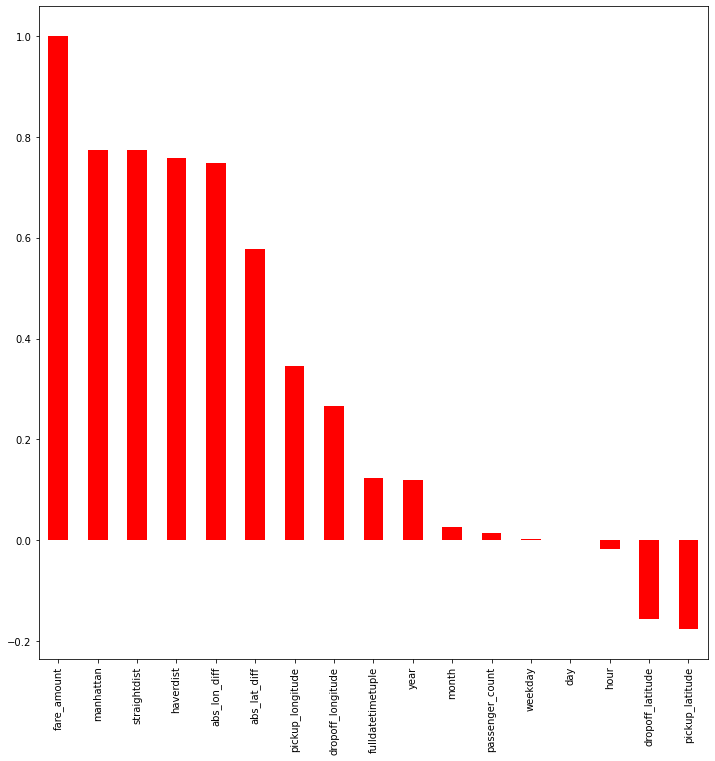

In [63]:
plt.figure(figsize = (12, 12))
corrs["fare_amount"].sort_values(ascending=False).plot.bar(color = "red")

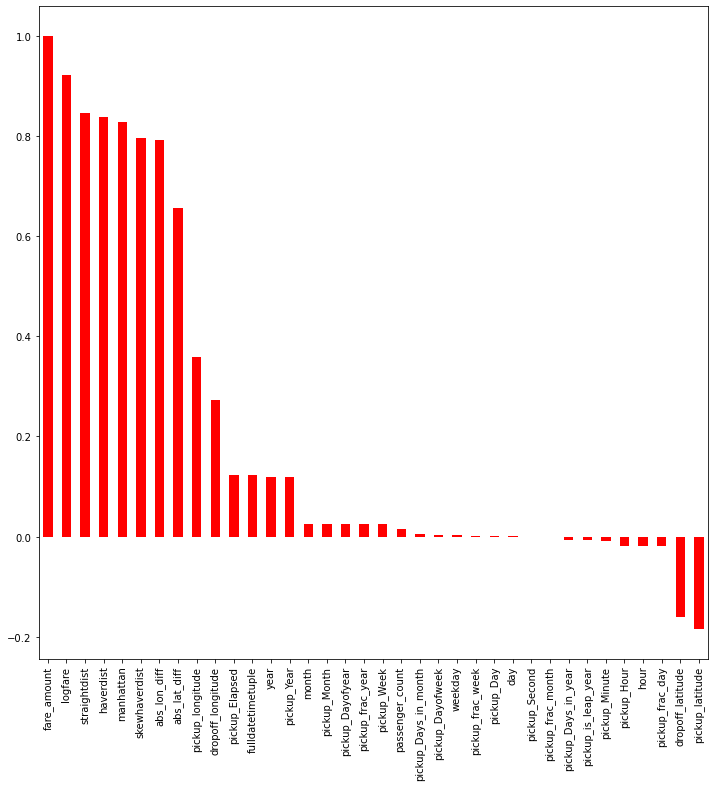

In [64]:
corrs = X.corr()

plt.figure(figsize = (12, 12))
corrs["fare_amount"].sort_values(ascending=False).plot.bar(color = "red")

In [65]:
X[X.isna().any(axis=1)]  #display all NA 

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,dataset,fare-bin,...,pickup_is_leap_year,pickup_Hour,pickup_Minute,pickup_Second,pickup_Days_in_year,pickup_frac_day,pickup_frac_week,pickup_frac_month,pickup_frac_year,pickup_Elapsed
0,2015-01-27 13:08:24.0000002,NaN,2015-01-27 13:08:24,-73.973320,40.763805,-73.981430,40.743835,1,test,[45+],...,False,13,8,24,365,0.547500,0.221071,0.860859,0.075266,191596058.0
1,2015-01-27 13:08:24.0000003,NaN,2015-01-27 13:08:24,-73.986862,40.719383,-73.998886,40.739201,1,test,[45+],...,False,13,8,24,365,0.547500,0.221071,0.860859,0.075266,191596058.0
2,2011-10-08 11:53:44.0000002,NaN,2011-10-08 11:53:44,-73.982524,40.751260,-73.979654,40.746139,1,test,[45+],...,False,11,53,44,365,0.495648,0.785093,0.265489,0.769114,87306778.0
3,2012-12-01 21:12:12.0000002,NaN,2012-12-01 21:12:12,-73.981160,40.767807,-73.990448,40.751635,1,test,[45+],...,True,21,12,12,366,0.883472,0.840496,0.058859,0.917939,123628286.0
4,2012-12-01 21:12:12.0000003,NaN,2012-12-01 21:12:12,-73.966046,40.789775,-73.988565,40.744427,1,test,[45+],...,True,21,12,12,366,0.883472,0.840496,0.058859,0.917939,123628286.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9909,2015-05-10 12:37:51.0000002,NaN,2015-05-10 12:37:51,-73.968124,40.796997,-73.955643,40.780388,6,test,[45+],...,False,12,37,51,365,0.526285,0.932326,0.328946,0.356629,200493425.0
9910,2015-01-12 17:05:51.0000001,NaN,2015-01-12 17:05:51,-73.945511,40.803600,-73.960213,40.776371,6,test,[45+],...,False,17,5,51,365,0.712396,0.101771,0.397262,0.034733,190314305.0
9911,2015-04-19 20:44:15.0000001,NaN,2015-04-19 20:44:15,-73.991600,40.726608,-73.789742,40.647011,6,test,[45+],...,False,20,44,15,365,0.864063,0.980580,0.640776,0.300175,198708209.0
9912,2015-01-31 01:05:19.0000005,NaN,2015-01-31 01:05:19,-73.985573,40.735432,-73.939178,40.801731,6,test,[45+],...,False,1,5,19,365,0.045359,0.720766,0.970167,0.084823,191898273.0


In [66]:
# test_y = X[X["dataset"] == "test"]
# test_y = test_y[["fare_amount"]].values

# filter_test = X["dataset"] == "test"
# filter_train = X["dataset"] == "train"

# train_y  = X[filter_train][["fare_amount"]].values
# train_X  = X[filter_train][["haverdist"]].values
# test_X  = X[filter_test][["haverdist"]].values

# features = ['year', 'hour', 'haverdist', 'passenger_count']
# features = ['year', 'hour', 'skewhaverdist', 'passenger_count']
# features_y = ['logfare']
# features = [ 'haverdist']

# train_y  = X[filter_train][features_y].values
# train_X  = X[filter_train][features].values
# test_X  = X[filter_test][features].values

# train_X = X[filter_train].drop(features_todrop, axis = 1).values
# test_X = X[filter_test].drop(features_todrop, axis = 1).values
# train_X = X[filter_train].drop(["key","fare_amount","pickup_datetime","dataset","pickup","dropoff"], axis = 1).values
# test_X = X[filter_test].drop(["key","fare_amount","pickup_datetime","dataset","pickup","dropoff"], axis = 1).values
# filtering data 
# data.where(filter, inplace = True) 

In [67]:
from sklearn.model_selection import train_test_split
X_tr, X_va, y_tr, y_va = train_test_split(X[X["dataset"]=="train"], np.array(X[X["dataset"]=="train"]['fare_amount']), test_size=0.25, random_state  = 100)

In [68]:
from sklearn.metrics import mean_squared_error
import warnings
warnings.filterwarnings('ignore', category = RuntimeWarning)

def metrics(train_pred, valid_pred, y_train, y_valid):
    """Calculate metrics:
       Root mean squared error and mean absolute percentage error"""
    
    # Root mean squared error
    train_rmse = np.sqrt(mean_squared_error(y_train, train_pred))
    valid_rmse = np.sqrt(mean_squared_error(y_valid, valid_pred))
    
    # Calculate absolute percentage error
    train_ape = abs((y_train - train_pred) / y_train)
    valid_ape = abs((y_valid - valid_pred) / y_valid)
    
    # Account for y values of 0
    train_ape[train_ape == np.inf] = 0
    train_ape[train_ape == -np.inf] = 0
    valid_ape[valid_ape == np.inf] = 0
    valid_ape[valid_ape == -np.inf] = 0
    
    train_mape = 100 * np.mean(train_ape)
    valid_mape = 100 * np.mean(valid_ape)
    
    return train_rmse, valid_rmse, train_mape, valid_mape

def evaluate(model, features, X_train, X_valid, y_train, y_valid):
    """Mean absolute percentage error"""
    
    # Make predictions
    train_pred = model.predict(X_train[features])
    valid_pred = model.predict(X_valid[features])
    
    # Get metrics
    train_rmse, valid_rmse, train_mape, valid_mape = metrics(train_pred, valid_pred,
                                                             y_train, y_valid)
    
    print(f'Training:   rmse = {round(train_rmse, 2)} \t mape = {round(train_mape, 2)}')
    print(f'Validation: rmse = {round(valid_rmse, 2)} \t mape = {round(valid_mape, 2)}')

In [69]:
y_tr

array([6.5, 5.7, 4.1, ..., 7. , 8.9, 6.1])

In [70]:
plt.figure(figsize = (12, 12))
corrs["fare_amount"].sort_values(ascending=False)

fare_amount             1.000000
logfare                 0.921442
straightdist            0.846137
haverdist               0.837471
manhattan               0.828732
skewhaverdist           0.795422
abs_lon_diff            0.792973
abs_lat_diff            0.656712
pickup_longitude        0.359285
dropoff_longitude       0.272479
pickup_Elapsed          0.123698
fulldatetimetuple       0.123698
year                    0.118966
pickup_Year             0.118966
month                   0.025657
pickup_Month            0.025657
pickup_Dayofyear        0.025567
pickup_frac_year        0.025501
pickup_Week             0.025478
passenger_count         0.014570
pickup_Days_in_month    0.004338
pickup_Dayofweek        0.003107
weekday                 0.003107
pickup_frac_week        0.000496
pickup_Day              0.000374
day                     0.000374
pickup_Second          -0.000333
pickup_frac_month      -0.000399
pickup_Days_in_year    -0.006994
pickup_is_leap_year    -0.006994
pickup_Min

<Figure size 864x864 with 0 Axes>

In [71]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score


# y_tr is ['fare_amount']
# features = ['year', 'hour', 'skewhaverdist', 'passenger_count']
features = ['abs_lon_diff', 'abs_lat_diff','haverdist', 'passenger_count']
model = LinearRegression()
model.fit(X_tr[features], y_tr)
py = model.predict(X_tr[features])
py_val = model.predict(X_va[features])
rmse = np.sqrt(mean_squared_error(y_tr, py))
rmse2 = np.sqrt(mean_squared_error(y_va, py_val))
print("rmse for training:", rmse)
print("rmse for validation:", rmse2)

# change y_tr as y_tr2 = ['logfare']
y_tr2  = np.array(X_tr['logfare'])
y_va2  = np.array(X_va['logfare'])
model.fit(X_tr[features], y_tr2)
py2 = model.predict(X_tr[features])
py2_val = model.predict(X_va[features])
rmse__2 = np.sqrt(mean_squared_error(y_tr2, py2))
rmse__2_val = np.sqrt(mean_squared_error(y_va2, py2_val))
print("rmse for training:", rmse__2)
print("rmse for validation:", rmse__2_val)


# def cv_rmse(model, X, y):
#     rmse = np.sqrt(-cross_val_score(model, X, y, scoring="neg_mean_squared_error", cv = 5).mean())
#     return print(rmse)
# cv_rmse(LinearRegression(), train_X, train_y)
# model.score(train_X, train_y)

rmse for training: 4.927154699931204
rmse for validation: 4.854684058808622
rmse for training: 0.3242480474094305
rmse for validation: 0.3212014684472185


In [72]:
#Use Bill Method 
# from sklearn.model_selection import train_test_split
# X_tr, X_va, y_tr, y_va = train_test_split(X, np.array(X['fare_amount']), test_size=0.25)

lr = LinearRegression()
features = ['abs_lon_diff', 'abs_lat_diff','haverdist', 'passenger_count']


lr.fit(X_tr[features], y_tr)

print('Intercept', round(lr.intercept_, 4))
print('abs_lat_diff coef: ', round(lr.coef_[0], 4), 
      '\tabs_lon_diff coef:', round(lr.coef_[1], 4),
      '\thaverdist coef:', round(lr.coef_[2], 4),
      '\tpassenger_count coef:', round(lr.coef_[3], 4)
     )

evaluate(lr, features, X_tr, X_va, y_tr, y_va)

Intercept 4.3964
abs_lat_diff coef:  -95.561 	abs_lon_diff coef: -228.8073 	haverdist coef: 4.176 	passenger_count coef: 0.0395
Training:   rmse = 4.93 	 mape = 24.13
Validation: rmse = 4.85 	 mape = 24.05


In [73]:
features = ['abs_lat_diff', 'abs_lon_diff', 'haverdist']


lr.fit(X_tr[features], y_tr)

print('Intercept', round(lr.intercept_, 4))
print('abs_lat_diff coef: ', round(lr.coef_[0], 4), 
      '\tabs_lon_diff coef:', round(lr.coef_[1], 4),
      '\thaverdist coef:', round(lr.coef_[2], 4)
     )

evaluate(lr, features, X_tr, X_va, y_tr, y_va)

Intercept 4.4626
abs_lat_diff coef:  -228.8147 	abs_lon_diff coef: -95.5651 	haverdist coef: 4.1762
Training:   rmse = 4.93 	 mape = 24.13
Validation: rmse = 4.86 	 mape = 24.06


### Use Random Forest : RMSE is better @3.35, but we found overfitting to validation dataset. We use pruning to mitigate 

In [74]:
from sklearn.ensemble import RandomForestRegressor

# Create the random forest
random_forest = RandomForestRegressor(n_estimators = 20, max_depth = 20, 
                                      max_features = None, oob_score = True, 
                                      bootstrap = True, verbose = 1, n_jobs = -1)

# Train on data
random_forest.fit(X_tr[['haverdist', 'abs_lat_diff', 'abs_lon_diff', 'passenger_count']], y_tr)
evaluate(random_forest, ['haverdist', 'abs_lat_diff', 'abs_lon_diff', 'passenger_count'],
         X_tr, X_va, y_tr, y_va)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:  1.1min finished
/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:832: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  20 out of  20 | elapsed:    2.8s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.


Training:   rmse = 3.35 	 mape = 19.55
Validation: rmse = 4.23 	 mape = 22.32


[Parallel(n_jobs=4)]: Done  20 out of  20 | elapsed:    0.9s finished


In [75]:
import pandas as pd
feature_importances = pd.DataFrame({'feature': ['haverdist', 'abs_lat_diff', 'abs_lon_diff', 'passenger_count'],
                                        'importance': random_forest.feature_importances_}).\
                           sort_values('importance', ascending = False).set_index('feature')
    

In [76]:
feature_importances

,importance
feature,
haverdist,0.905729
abs_lon_diff,0.056043
abs_lat_diff,0.033171
passenger_count,0.005057


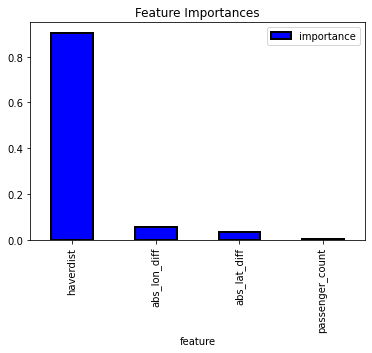

In [77]:
feature_importances.plot.bar(color = 'b', edgecolor = 'k', linewidth = 2);
plt.title('Feature Importances');

In [78]:
X_tr.columns

Index(['key', 'fare_amount', 'pickup_datetime', 'pickup_longitude',
       'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude',
       'passenger_count', 'dataset', 'fare-bin', 'color', 'abs_lat_diff',
       'abs_lon_diff', 'hour', 'day', 'month', 'weekday', 'year',
       'fulldatetimetuple', 'straightdist', 'manhattan', 'pickup', 'dropoff',
       'haverdist', 'logfare', 'skewhaverdist', 'pickup_Year', 'pickup_Month',
       'pickup_Week', 'pickup_Day', 'pickup_Dayofweek', 'pickup_Dayofyear',
       'pickup_Days_in_month', 'pickup_is_leap_year', 'pickup_Hour',
       'pickup_Minute', 'pickup_Second', 'pickup_Days_in_year',
       'pickup_frac_day', 'pickup_frac_week', 'pickup_frac_month',
       'pickup_frac_year', 'pickup_Elapsed'],
      dtype='object')

In [79]:
random_forest.fit(X_tr[['haverdist', 'abs_lat_diff', 'abs_lon_diff', 'passenger_count','pickup_Elapsed','manhattan','pickup_longitude','pickup_latitude', 'dropoff_longitude','dropoff_latitude']], y_tr)
evaluate(random_forest, ['haverdist', 'abs_lat_diff', 'abs_lon_diff', 'passenger_count','pickup_Elapsed','manhattan','pickup_longitude','pickup_latitude', 'dropoff_longitude','dropoff_latitude'],
         X_tr, X_va, y_tr, y_va)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:  3.0min finished
/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:832: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  20 out of  20 | elapsed:    2.8s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.


Training:   rmse = 2.54 	 mape = 15.67
Validation: rmse = 3.49 	 mape = 18.41


[Parallel(n_jobs=4)]: Done  20 out of  20 | elapsed:    1.0s finished


Pruning : cut max_depth from 20 to 10; however, result is not satisfactory

In [80]:
from sklearn.ensemble import RandomForestRegressor

# Create the random forest
random_forest = RandomForestRegressor(n_estimators = 20, max_depth = 10, 
                                      max_features = None, oob_score = True, 
                                      bootstrap = True, verbose = 1, n_jobs = -1)

# Train on data
random_forest.fit(X_tr[['haverdist', 'abs_lat_diff', 'abs_lon_diff', 'passenger_count','pickup_Elapsed','manhattan','pickup_longitude','pickup_latitude', 'dropoff_longitude','dropoff_latitude']], y_tr)
evaluate(random_forest, ['haverdist', 'abs_lat_diff', 'abs_lon_diff', 'passenger_count','pickup_Elapsed','manhattan','pickup_longitude','pickup_latitude', 'dropoff_longitude','dropoff_latitude'],
         X_tr, X_va, y_tr, y_va)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:  1.7min finished
/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:832: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  20 out of  20 | elapsed:    0.8s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.


Training:   rmse = 3.48 	 mape = 19.51
Validation: rmse = 3.6 	 mape = 19.81


[Parallel(n_jobs=4)]: Done  20 out of  20 | elapsed:    0.3s finished


### Linear Regression + Standard Scalar

In [81]:
# define some handy analysis support function
from sklearn.metrics import mean_squared_error, explained_variance_score

def plot_prediction_analysis(y, y_pred, figsize=(10,4), title=''):
    fig, axs = plt.subplots(1, 2, figsize=figsize)
    axs[0].scatter(y, y_pred)
    mn = min(np.min(y), np.min(y_pred))
    mx = max(np.max(y), np.max(y_pred))
    axs[0].plot([mn, mx], [mn, mx], c='red')
    axs[0].set_xlabel('$y$')
    axs[0].set_ylabel('$\hat{y}$')
    rmse = np.sqrt(mean_squared_error(y, y_pred))
    evs = explained_variance_score(y, y_pred)
    axs[0].set_title('rmse = {:.2f}, evs = {:.2f}'.format(rmse, evs))
    
    axs[1].hist(y-y_pred, bins=50)
    avg = np.mean(y-y_pred)
    std = np.std(y-y_pred)
    axs[1].set_xlabel('$y - \hat{y}$')
    axs[1].set_title('Histrogram prediction error, $\mu$ = {:.2f}, $\sigma$ = {:.2f}'.format(avg, std))
    
    if title!='':
        fig.suptitle(title)

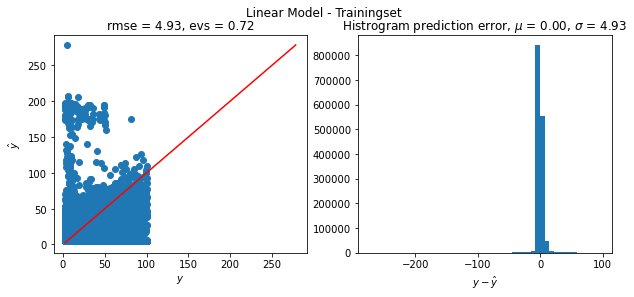

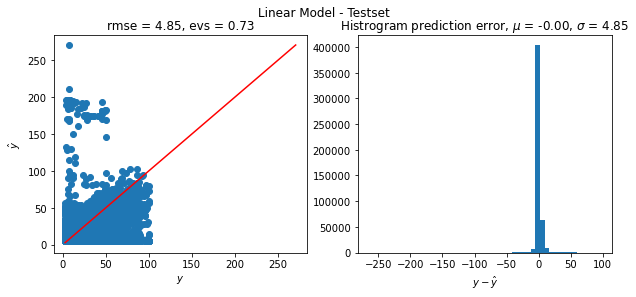

In [82]:
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler

model_lin = Pipeline((
        ("standard_scaler", StandardScaler()),
        ("lin_reg", LinearRegression()),
    ))


features = ['haverdist', 'abs_lat_diff', 'abs_lon_diff', 'passenger_count']
model_lin.fit(X_tr[features], y_tr)


y_train_pred = model_lin.predict(X_tr[features])
plot_prediction_analysis(y_tr, y_train_pred, title='Linear Model - Trainingset')

y_test_pred = model_lin.predict(X_va[features])
plot_prediction_analysis(y_va, y_test_pred, title='Linear Model - Testset')

/opt/conda/lib/python3.7/site-packages/seaborn/axisgrid.py:2272: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


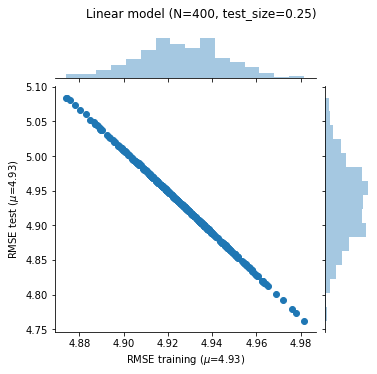

In [83]:
def plot_rmse_analysis(model, X, y, N=400, test_size=0.25, figsize=(10,4), title=''):
    rmse_train, rmse_test = [], []
    for i in range(N):
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size)

        model.fit(X_train, y_train)
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)

        rmse_train.append(np.sqrt(mean_squared_error(y_train, y_train_pred)))
        rmse_test.append(np.sqrt(mean_squared_error(y_test, y_test_pred)))

    g = sns.jointplot(np.array(rmse_train), np.array(rmse_test), kind='scatter', stat_func=None, size=5)
    g.set_axis_labels("RMSE training ($\mu$={:.2f})".format(np.mean(rmse_train)), 
                      "RMSE test ($\mu$={:.2f})".format(np.mean(rmse_test)))
    plt.subplots_adjust(top=0.9)
    g.fig.suptitle('{} (N={}, test_size={:0.2f})'.format(title, N, test_size))

plot_rmse_analysis(model_lin, X_tr[features], y_tr, title='Linear model')  
    

In [84]:
X_tr.columns

Index(['key', 'fare_amount', 'pickup_datetime', 'pickup_longitude',
       'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude',
       'passenger_count', 'dataset', 'fare-bin', 'color', 'abs_lat_diff',
       'abs_lon_diff', 'hour', 'day', 'month', 'weekday', 'year',
       'fulldatetimetuple', 'straightdist', 'manhattan', 'pickup', 'dropoff',
       'haverdist', 'logfare', 'skewhaverdist', 'pickup_Year', 'pickup_Month',
       'pickup_Week', 'pickup_Day', 'pickup_Dayofweek', 'pickup_Dayofyear',
       'pickup_Days_in_month', 'pickup_is_leap_year', 'pickup_Hour',
       'pickup_Minute', 'pickup_Second', 'pickup_Days_in_year',
       'pickup_frac_day', 'pickup_frac_week', 'pickup_frac_month',
       'pickup_frac_year', 'pickup_Elapsed'],
      dtype='object')

Adding time features 

In [85]:
time_features = ['pickup_Year', 'pickup_Month',
       'pickup_Week', 'pickup_Day', 'pickup_Dayofweek', 'pickup_Dayofyear',
       'pickup_Days_in_month', 'pickup_is_leap_year', 'pickup_Hour',
       'pickup_Minute', 'pickup_Second', 'pickup_Days_in_year',
       'pickup_frac_day', 'pickup_frac_week', 'pickup_frac_month',
       'pickup_frac_year', 'pickup_Elapsed']

features2 = ['abs_lat_diff', 'abs_lon_diff', 'haverdist', 'passenger_count',
            'pickup_latitude', 'pickup_longitude', 
            'dropoff_latitude', 'dropoff_longitude','manhattan'] + time_features

In [86]:
from sklearn.ensemble import RandomForestRegressor

# Create the random forest
random_forest = RandomForestRegressor(n_estimators = 20, max_depth = 20, 
                                      max_features = None, oob_score = True, 
                                      bootstrap = True, verbose = 1, n_jobs = -1)

# Train on data
random_forest.fit(X_tr[features2], y_tr)
evaluate(random_forest, features2,
         X_tr, X_va, y_tr, y_va)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:  5.5min finished
/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:832: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  20 out of  20 | elapsed:    3.1s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.


Training:   rmse = 2.4 	 mape = 14.72
Validation: rmse = 3.45 	 mape = 17.79


[Parallel(n_jobs=4)]: Done  20 out of  20 | elapsed:    1.0s finished


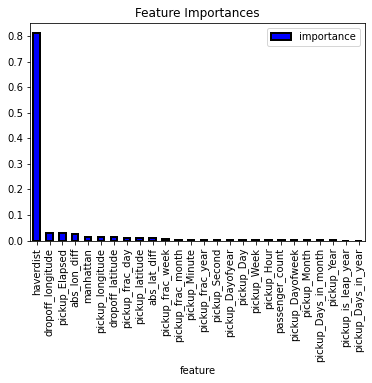

In [87]:
col = X_tr[features2].columns.tolist()
col2 = np.array(col)
col2.shape

import pandas as pd
feature_importances = pd.DataFrame({'feature': col2,
                                        'importance': random_forest.feature_importances_}).\
                           sort_values('importance', ascending = False).set_index('feature')

feature_importances.plot.bar(color = 'b', edgecolor = 'k', linewidth = 2);
plt.title('Feature Importances');


Fineturning the parameters to mitigate overfitting

In [88]:
from sklearn.model_selection import RandomizedSearchCV

# Hyperparameter grid
param_grid = {
    'n_estimators': np.linspace(10, 100).astype(int),
    'max_depth': [None] + list(np.linspace(5, 30).astype(int)),
    'max_features': ['auto', 'sqrt', None] + list(np.arange(0.5, 1, 0.1)),
    'max_leaf_nodes': [None] + list(np.linspace(10, 50, 500).astype(int)),
    'min_samples_split': [2, 5, 10],
    'bootstrap': [True, False]
}

# Estimator for use in random search
estimator = RandomForestRegressor(random_state = 100)

# Create the random search model, change "interation"
rs = RandomizedSearchCV(estimator, param_grid, n_jobs = -1, 
                        scoring = 'neg_mean_absolute_error', cv = 3, 
                        n_iter = 5, verbose = 1, random_state=100)


# Train on data
rs.fit(X_tr[features2], y_tr)
bestmodel = rs.best_estimator_
bestmodelscore = rs.best_score_

Fitting 3 folds for each of 5 candidates, totalling 15 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed: 42.0min finished


In [89]:
bestmodel

RandomForestRegressor(bootstrap=False, max_depth=17,
                      max_features=0.7999999999999999, max_leaf_nodes=42,
                      min_samples_split=10, n_estimators=26, random_state=100)

In [90]:
y_train_bestrf = bestmodel.predict(X_tr[features2])
rmse = np.sqrt(mean_squared_error(y_train_bestrf, y_tr))
print("train_rmse = ", rmse)

y_valid_bestrf  = bestmodel.predict(X_va[features2])
rmse = np.sqrt(mean_squared_error(y_valid_bestrf , y_va))
print("valid_rmse = ", rmse)

train_rmse =  3.838850182098709
valid_rmse =  3.842457728257508


### Gradient Boosting ###

In [91]:
import lightgbm as lgbm

# features = ['haverdist', 'abs_lat_diff', 'abs_lon_diff', 'passenger_count','pickup_Elapsed','manhattan','pickup_longitude','pickup_latitude', 'dropoff_longitude','dropoff_latitude']

params = {
        'boosting_type':'gbdt',
        'objective': 'regression',
        'nthread': -1,
        'verbose': 0,
        'num_leaves': 31,
        'learning_rate': 0.05,
        'max_depth': -1,
        'subsample': 0.8,
        'subsample_freq': 1,
        'colsample_bytree': 0.6,
        'reg_aplha': 1,
        'reg_lambda': 0.001,
        'metric': 'rmse',
        'min_split_gain': 0.5,
        'min_child_weight': 1,
        'min_child_samples': 10,
        'scale_pos_weight':1     
    }
train_set = lgbm.Dataset(X_tr[features2], y_tr)
valid_set = lgbm.Dataset(X_va[features2], y_va)

gb = lgbm.train(params, train_set = train_set, num_boost_round=300)

In [92]:
y_train_gb = gb.predict(X_tr[features2])
rmse = np.sqrt(mean_squared_error(y_train_gb, y_tr))
print("train_rmse = ", rmse)

y_valid_gb = gb.predict(X_va[features2])
rmse = np.sqrt(mean_squared_error(y_valid_gb, y_va))
print("valid_rmse = ", rmse)

train_rmse =  3.3539766446210058
valid_rmse =  3.426301695929308


In [93]:
import xgboost as xgb

# features = ['haverdist', 'abs_lat_diff', 'abs_lon_diff', 'passenger_count','pickup_Elapsed','manhattan','pickup_longitude','pickup_latitude', 'dropoff_longitude','dropoff_latitude']


dtrain_xg = xgb.DMatrix(X_tr[features2], label=y_tr)
dval_xg = xgb.DMatrix(X_va[features2])

params = {'max_depth':7,
          'eta':1,
          'silent':1,
          'objective':'reg:linear',
          'eval_metric':'rmse',
          'learning_rate':0.05
         }
num_rounds = 50
xb = xgb.train(params, dtrain_xg, num_rounds)


# y_train_xgb = xb.predict(dtrain)
# rmse = np.sqrt(mean_squared_error(y_train_xgb, y_tr))
# rmse

[11:26:54] WARNING: /workspace/src/objective/regression_obj.cu:168: reg:linear is now deprecated in favor of reg:squarederror.
[11:26:54] WARNING: /workspace/src/learner.cc:480: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[11:29:40] WARNING: /workspace/src/objective/regression_obj.cu:168: reg:linear is now deprecated in favor of reg:squarederror.


In [94]:
y_train_xg = xb.predict(dtrain_xg)
rmse = np.sqrt(mean_squared_error(y_train_xg, y_tr))
print("train_rmse = ", rmse)


y_valid_xg = xb.predict(dval_xg)
rmse2 = np.sqrt(mean_squared_error(y_valid_xg, y_va))
print("valid_rmse = ", rmse2)

train_rmse =  3.659160070236687
valid_rmse =  3.6980700697610493


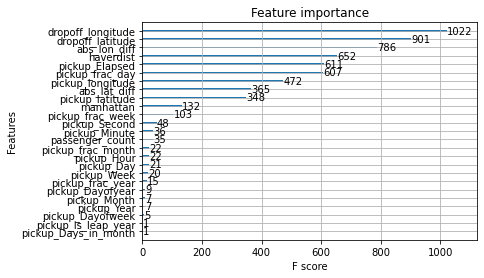

In [95]:
xgb.plot_importance(xb)


### MODEL SUBMISSION ###

In [96]:
# predict_y = model.predict(test_X)

# rerunning the model include the testing dataset 
# xb = xgb.train(params, dtrain, num_rounds)
predict_y = gb.predict(X[X["dataset"] == "test"][features2])

# predict_y = model_lin.predict(test_X)
# predict_y = np.expm1(predict_y)

In [97]:
predict_y.shape

(9914,)

In [98]:
# predict_y = predict_y[:,0]

In [99]:
#Create submission file
submission = pd.DataFrame({'key': X[X["dataset"] == "test"]["key"],
    'fare_amount':predict_y.round(2)
})


submission.to_csv('taxi_fare_submission.csv',index=False)
submission.head()

,key,fare_amount
0,2015-01-27 13:08:24.0000002,10.48
1,2015-01-27 13:08:24.0000003,10.63
2,2011-10-08 11:53:44.0000002,4.69
3,2012-12-01 21:12:12.0000002,8.44
4,2012-12-01 21:12:12.0000003,15.06


## Special Thanks to 

https://www.kaggle.com/danpavlov/ny-taxi-fare-comprehensive-and-simple-analysis


https://www.kaggle.com/willkoehrsen/a-walkthrough-and-a-challenge